# Image Generation on Vertex AI (Level I), adapted for Innovation Week

In [ ]:
# Copyright 2024 Google LLC
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

## Credits

**Please check the [original public notebooks for GenAI](https://github.com/GoogleCloudPlatform/generative-ai) for  more information**. GCC team has merged some of these notebooks + made new additions in order to make this new notebook suitable to GCC's Innovation Week.

**Note: This notebook has been adapted to be run in Vertex Workbench.** If you want to run it locally, or in Colab, you will need some additional cells, e.g. for authentication (they can be found in the original notebooks above).

## Overview

[Imagen on Vertex AI](https://cloud.google.com/vertex-ai/docs/generative-ai/image/overview) brings Google's state of the art generative AI capabilities to application developers. With Imagen on Vertex AI, application developers can build next-generation AI products that transform their user's imagination into high quality visual assets, in seconds.

With Imagen, you can:
1) **Generate novel images using only a text prompt (text-to-image generation)**.
2) Edit an entire uploaded or generated image with a text prompt.
3) Edit only parts of an uploaded or generated image using a mask area you define.
4) Upscale existing, generated, or edited images.
5) Fine-tune a model with a specific subject (for example, a specific handbag or shoe) for image generation.
6) Get text descriptions of images with visual captioning.
7) Get answers to a question about an image with Visual Question Answering (VQA).

This notebook focuses on image generation only. This knowledge pill is focused on 1-3 (**image generation + edit**) only. You can read more about image generation features from Imagen [here](https://cloud.google.com/vertex-ai/docs/generative-ai/image/generate-images).


### Objectives

In this notebook, you will be exploring the image generation features of Imagen using the Vertex AI Python SDK. You will

- generate images using text prompts
- experiment with different parameters, such as:
    - increasing the number of images to be generated
    - fixing a seed number for reproducibility
    - influencing the output images using negative prompts

### Costs

- This notebook uses billable components of Google Cloud:
  - Vertex AI (Imagen)

- Learn about [Vertex AI pricing](https://cloud.google.com/vertex-ai/pricing) and use the [Pricing Calculator](https://cloud.google.com/products/calculator/) to generate a cost estimate based on your projected usage.

## Getting Started

### Install Vertex AI SDK for Python

In [1]:
! pip install --quiet --upgrade --user google-cloud-aiplatform

### Restart current runtime

To use the newly installed packages in this Jupyter runtime, it is recommended to restart the runtime. Run the following cell to restart the current kernel.

The restart process might take a minute or so.

In [2]:
import IPython
import time

app = IPython.Application.instance()
app.kernel.do_shutdown(True)

{'status': 'ok', 'restart': True}

After the restart is complete, continue to the next step.



<div class="alert alert-block alert-warning">
<b>⚠️ The kernel is going to restart. Please wait until it is finished before continuing to the next step. ⚠️</b>
</div>

### Load the image generation model

The model names from Vertex AI Imagen have two components: model name and version number. The naming convention follow this format: `<model-name>@<version-number>`. For example, `imagegeneration@001` represent the version **001** of the **imagetext** model.



In [1]:
from vertexai.preview.vision_models import ImageGenerationModel

generation_model = ImageGenerationModel.from_pretrained("imagegeneration@005")

### Generate an image

The `generate_image` function can be used to generate images. All you need is a text prompt.

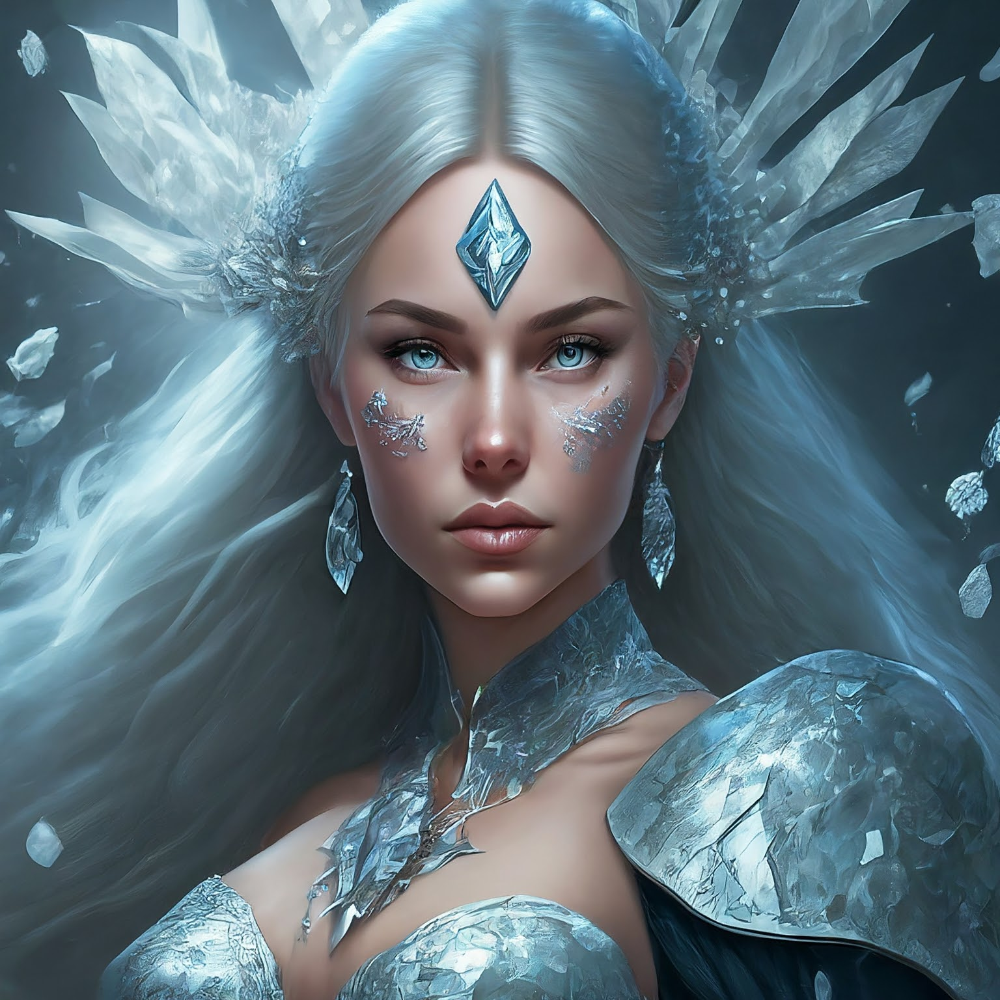

In [2]:
prompt = "A beautiful ice princess with silver hair, fantasy concept art style"

response = generation_model.generate_images(
    prompt=prompt, number_of_images=4
)

response.images[0].show()

Now, you have the power to generate the image you desire. Here are some example prompts to inspire you:
1. A raccoon wearing formal clothes, wearing a top hat. Oil painting in the style of Vincent Van Gogh.
2. A digital collage of famous works of art, all blended together into one cohesive image.
3. A whimsical scene from a children's book, such as a tea party with talking animals.
4. A futuristic cityscape with towering skyscrapers and flying cars.
5. A studio photo of a modern armchair, dramatic lighting, warm.
6. A surreal landscape of a city made of ice and snow.

Let's try nb (4), and then try it with a prompt improvement: adding "a photorealistic picture"

###  Explore different parameters

The `generate_images` function accepts additional parameters that can be used to influence the generated images. The following sections will explore how to influence the output images through the use of those additional parameters.

In [13]:
import math
import matplotlib.pyplot as plt


# An axuillary function to display images in grid
def display_images_in_grid(images):
    """Displays the provided images in a grid format. 4 images per row.

    Args:
        images: A list of PIL Image objects representing the images to display.
    """

    # Determine the number of rows and columns for the grid layout.
    nrows = math.ceil(len(images) / 4)  # Display at most 4 images per row
    ncols = min(len(images) + 1, 4)  # Adjust columns based on the number of images

    # Create a figure and axes for the grid layout.
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 6))

    for i, ax in enumerate(axes.flat):
        if i < len(images):
            # Display the image in the current axis.
            ax.imshow(images[i]._pil_image)

            # Adjust the axis aspect ratio to maintain image proportions.
            ax.set_aspect("equal")

            # Disable axis ticks for a cleaner appearance.
            ax.set_xticks([])
            ax.set_yticks([])
        else:
            # Hide empty subplots to avoid displaying blank axes.
            ax.axis("off")

    # Adjust the layout to minimize whitespace between subplots.
    plt.tight_layout()

    # Display the figure with the arranged images.
    plt.show()

#### number_of_images

You can use the `number_of_images` parameter to generate up to eight images.

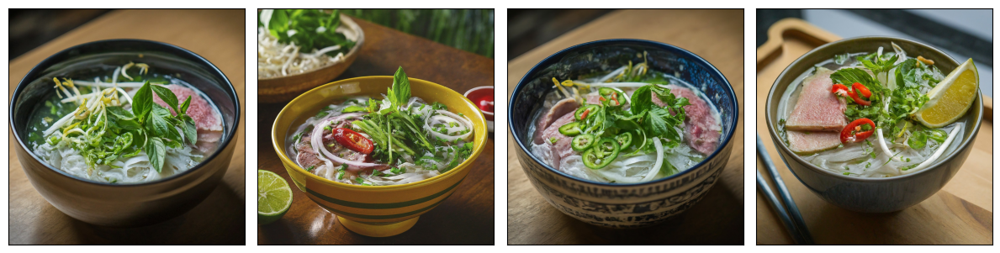

In [15]:
prompt = "a deliciuos bowl of pho from Vietnam"

response = generation_model.generate_images(
    prompt=prompt,
    number_of_images=4,
)

display_images_in_grid(response.images)

Try running the code a few time and observe the generate images. You will notice that the model generates a new set of images each time, even though the same prompt is used.

#### seed

With the `seed` parameter, you can influence the model to create the same output from the same input every time. Please note that the order of the generated images may still change.

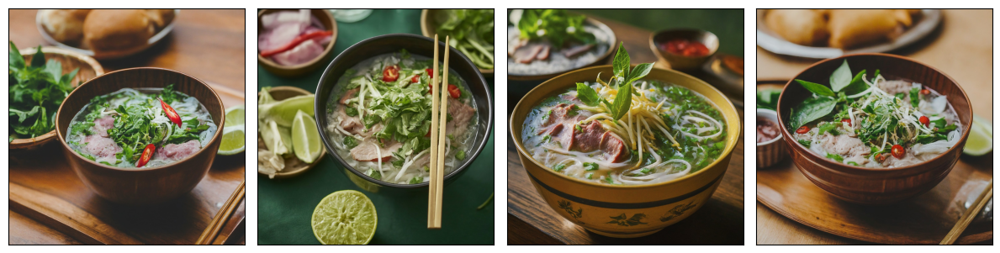

In [16]:
response = generation_model.generate_images(
    prompt=prompt,
    number_of_images=4,
    seed=42,
)

display_images_in_grid(response.images)

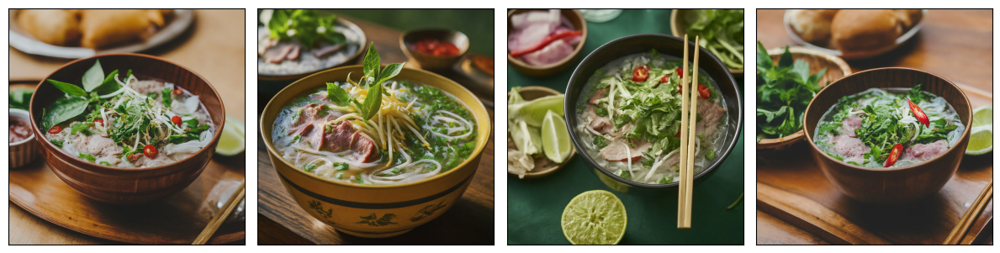

In [17]:
response = generation_model.generate_images(
    prompt=prompt,
    number_of_images=4,
    seed=42,
)

display_images_in_grid(response.images)

As can be observed, the model produced an identical set of images after utilizing the seed parameter, although the order of the images varies.

#### negative_prompt

Objects you do not want to generate can be excluded using the `negative_prompt` parameter. "Bean sprout" was given as a negative prompt in the example below. As a result, despite using the same prompt and seed number, the model did not produce bean sprout in the images.

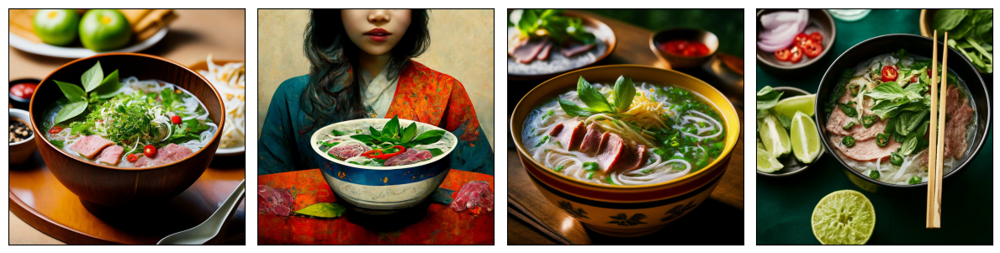

In [18]:
response = generation_model.generate_images(
    prompt=prompt,
    number_of_images=4,
    seed=42,
    negative_prompt="bean sprout",
)

display_images_in_grid(response.images)

## Conclusion

You have explored the Imagen's image generation features through the Vertex AI Python SDK, including the additional parameters that influence image generation. The next step is to enhance your skills by exploring this [prompting guide](https://cloud.google.com/vertex-ai/docs/generative-ai/image/img-gen-prompt-guide?_ga=2.128324367.-2094800479.1701746552&_gac=1.219926379.1701161688.CjwKCAiAvJarBhA1EiwAGgZl0LFQUFOFZUxfNPlzjB4T00PDiLeCIEYfY-coLbX9eUfHKr_i8VbtSBoCEJQQAvD_BwE). Through practice, you will become proficient in the art of image prompting.

### Generate an image - Examples adapted to Mapfre

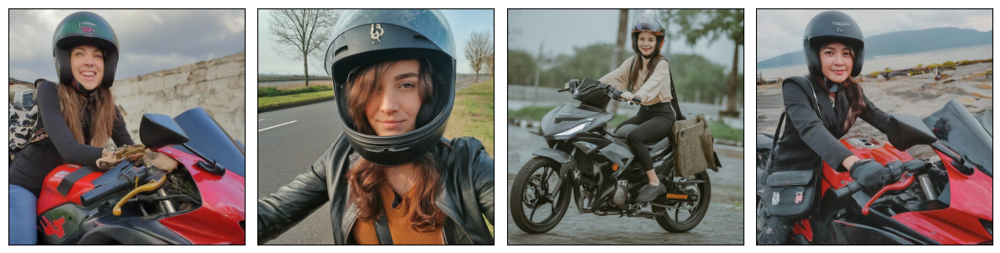

In [26]:
prompt="A young woman in her motorbike with a bag wearing a helmet"

response = generation_model.generate_images(
    prompt=prompt,
    number_of_images=4,
    seed=42
)

display_images_in_grid(response.images)

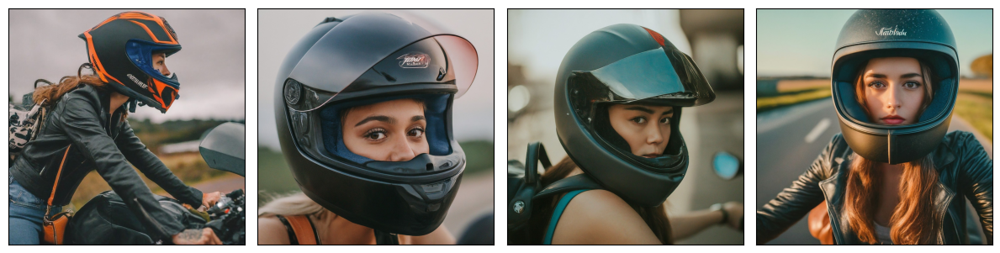

In [25]:
prompt="A photo of a young woman in her motorbike with a bag wearing a helmet, 100mm Macro lens"

response = generation_model.generate_images(
    prompt=prompt,
    number_of_images=4,
    seed=42
)

display_images_in_grid(response.images)

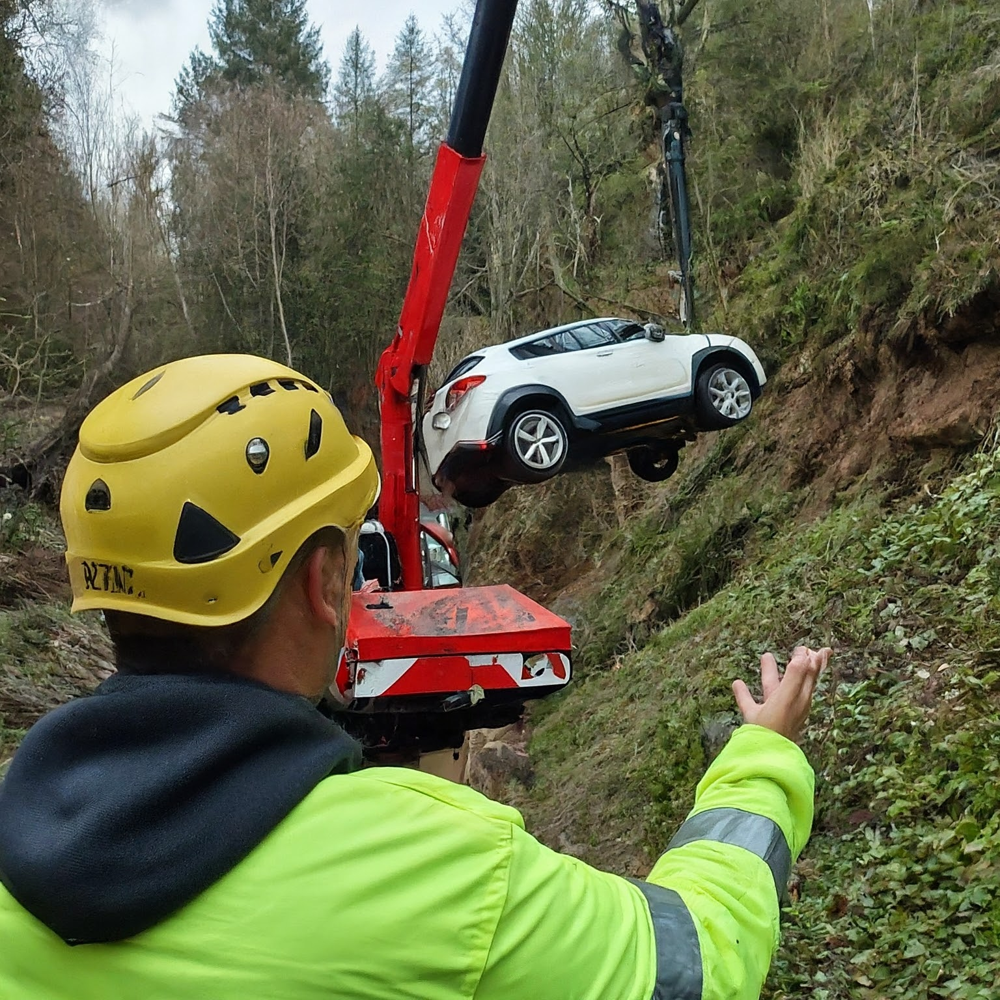

In [14]:
prompt = """Una foto realista desde detrás-arriba de una persona con un chaleco reflectante y un casco amarillo, 
dando indicaciones para sacar un coche blanco de un barranco mediante una grúa roja, en un bosque"""

response = generation_model.generate_images(
    prompt=prompt,
    seed=42,
    language='auto'
)

generated_img = response.images[0]

generated_img.show()